In [1]:
import os
import random
import itertools
import time
import gc
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_sample_weight
from skimage.feature import local_binary_pattern, hog
from skimage.feature import graycomatrix, graycoprops
from xgboost import XGBClassifier
from tqdm import tqdm
import pickle  # Để lưu và tải model

# Tắt log & Cấu hình hiển thị
optuna.logging.set_verbosity(optuna.logging.WARNING)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# ===================================================================
# 0. SETUP & LOAD DATA
# ===================================================================
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
SEED = 42
seed_everything(SEED)

DATA_SOURCES = {
    'haze': '/kaggle/input/weather-dataset/dataset/fogsmog',
    'rain': '/kaggle/input/weather-dataset/dataset/rain',
    'shine': '/kaggle/input/multiclass-weather-dataset/Multi-class Weather Dataset/Shine'
}
IMG_SIZE = 256
HOG_PPC = 16

print("[0] LOADING PATHS...")
img_paths, labels_raw = [], []
for label, path in DATA_SOURCES.items():
    if os.path.exists(path):
        files = sorted([os.path.join(path, f) for f in os.listdir(path) if f.lower().endswith(('.jpg','.png','.jpeg'))])
        img_paths.extend(files)
        labels_raw.extend([label] * len(files))

le = LabelEncoder()
y_encoded = le.fit_transform(labels_raw)
class_names = le.classes_

# ===================================================================
# 1. FEATURE EXTRACTION
# ===================================================================
def get_color_stats(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return [np.mean(hsv[:,:,i]) for i in range(3)] + [np.std(hsv[:,:,i]) for i in range(3)]
def get_sobel_stats(gray):
    sx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(sx**2 + sy**2)
    return [np.mean(mag), np.var(mag)]
def get_lbp_hist(gray):
    lbp = local_binary_pattern(gray, P=8, R=1, method="uniform")
    hist, _ = np.histogram(lbp.ravel(), bins=10, range=(0, 10))
    hist = hist.astype("float"); return hist / (hist.sum() + 1e-7)
def get_hog_stats(gray):
    hog_v = hog(gray, orientations=12, pixels_per_cell=(HOG_PPC, HOG_PPC), cells_per_block=(2,2), visualize=False, feature_vector=True)
    return [np.mean(hog_v), np.std(hog_v), np.max(hog_v)]
def get_glcm_stats(gray):
    glcm = graycomatrix(gray, distances=[1], angles=[0, np.pi/2], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').flatten()
    correlation = graycoprops(glcm, 'correlation').flatten()
    energy = graycoprops(glcm, 'energy').flatten()
    homogeneity = graycoprops(glcm, 'homogeneity').flatten()
    return np.concatenate([contrast, correlation, energy, homogeneity])

def extract_all(paths):
    l_c, l_s, l_l, l_h, l_glcm = [], [], [], [], []
    print("[1] Extracting features...")
    for path in tqdm(paths):
        img = cv2.imread(path); img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        l_c.append(get_color_stats(img))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        l_s.append(get_sobel_stats(gray)); l_l.append(get_lbp_hist(gray))
        l_h.append(get_hog_stats(gray)); l_glcm.append(get_glcm_stats(gray))
    return {'Color': np.array(l_c), 'Sobel': np.array(l_s), 'LBP': np.array(l_l), 'HOG': np.array(l_h), 'GLCM': np.array(l_glcm)}

all_features = extract_all(img_paths)

indices = np.arange(len(img_paths))
X_train_idx, X_test_idx, y_train, y_test = train_test_split(indices, y_encoded, test_size=0.2, random_state=SEED, stratify=y_encoded)
# CV Strategy
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

base_features = ['Color', 'Sobel', 'LBP', 'HOG', 'GLCM']
all_combinations = []
for r in range(1, len(base_features) + 1):
    for combo in itertools.combinations(base_features, r):
        all_combinations.append({'name': " + ".join(combo), 'components': list(combo)})

def plot_cm(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names)
    plt.title(title, fontsize=10); plt.ylabel('True Label'); plt.xlabel('Predicted Label'); plt.tight_layout(); plt.show()

# ===================================================================
# 2. TRAIN MODELS WITH OPTIMIZED PARAMETERS
# ===================================================================

# 2.1. Train Best Model (Color + GLCM)
best_params = {
    'n_estimators': 233,
    'max_depth': 8,
    'learning_rate': 0.2280,
    'subsample': 0.7077,
    'colsample_bytree': 0.6197,
    'min_child_weight': 1,
    'gamma': 0.0476,
    'use_balancing': True  # Assuming this was the best setting
}

# Prepare data for Best Model
X_train_best = np.hstack([all_features['Color'][X_train_idx], all_features['GLCM'][X_train_idx]])
X_test_best = np.hstack([all_features['Color'][X_test_idx], all_features['GLCM'][X_test_idx]])

# Apply scaling
scaler_best = StandardScaler()
X_train_best_scaled = scaler_best.fit_transform(X_train_best)
X_test_best_scaled = scaler_best.transform(X_test_best)

# Apply balancing if needed
sample_weights_best = compute_sample_weight('balanced', y_train) if best_params['use_balancing'] else None

# Train Best Model
best_xgb = XGBClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    learning_rate=best_params['learning_rate'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    min_child_weight=best_params['min_child_weight'],
    gamma=best_params['gamma'],
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=SEED,
    n_jobs=-1
)
best_xgb.fit(X_train_best_scaled, y_train, sample_weight=sample_weights_best)

# 2.2. Train Worst Model (HOG)
worst_params = {
    'n_estimators': 225,
    'max_depth': 9,
    'learning_rate': 0.0165,
    'subsample': 0.7382,
    'colsample_bytree': 0.9974,
    'min_child_weight': 1,
    'gamma': 4.4554,
    'use_balancing': True  # Assuming this was the best setting
}

# Prepare data for Worst Model
X_train_worst = all_features['HOG'][X_train_idx]
X_test_worst = all_features['HOG'][X_test_idx]

# Apply scaling
scaler_worst = StandardScaler()
X_train_worst_scaled = scaler_worst.fit_transform(X_train_worst)
X_test_worst_scaled = scaler_worst.transform(X_test_worst)

# Apply balancing if needed
sample_weights_worst = compute_sample_weight('balanced', y_train) if worst_params['use_balancing'] else None

# Train Worst Model
worst_xgb = XGBClassifier(
    n_estimators=worst_params['n_estimators'],
    max_depth=worst_params['max_depth'],
    learning_rate=worst_params['learning_rate'],
    subsample=worst_params['subsample'],
    colsample_bytree=worst_params['colsample_bytree'],
    min_child_weight=worst_params['min_child_weight'],
    gamma=worst_params['gamma'],
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=SEED,
    n_jobs=-1
)
worst_xgb.fit(X_train_worst_scaled, y_train, sample_weight=sample_weights_worst)

# ===================================================================
# 3. PREDICT AND VISUALIZE
# ===================================================================

# Dự đoán với 2 model
y_pred_best = best_xgb.predict(X_test_best_scaled)
y_pred_worst = worst_xgb.predict(X_test_worst_scaled)

# ===================================================================
# 4. CHỌN ẢNH VÀ TRỰC QUAN HÓA
# ===================================================================

# 1. Tìm ảnh mà cả hai model dự đoán đúng
correct_both_indices = np.where((y_pred_best == y_test[X_test_idx]) & (y_pred_worst == y_test[X_test_idx]))[0]
correct_both_img_paths = [img_paths[X_test_idx[i]] for i in correct_both_indices]
# 2. Tìm ảnh mà best đúng, worst sai
correct_best_wrong_worst_indices = np.where((y_pred_best == y_test[X_test_idx]) & (y_pred_worst != y_test[X_test_idx]))[0]
correct_best_wrong_worst_img_paths = [img_paths[X_test_idx[i]] for i in correct_best_wrong_worst_indices]

# Chọn 5 ảnh theo yêu cầu
num_correct_both = min(3, len(correct_both_img_paths))
num_correct_best_wrong_worst = min(2, len(correct_best_wrong_worst_img_paths))

selected_indices = []
selected_indices.extend(correct_both_indices[:num_correct_both])
selected_indices.extend(correct_best_wrong_worst_indices[:num_correct_best_wrong_worst])

if len(selected_indices) < 5:
    print(f"WARNING: Only {len(selected_indices)} images found matching the criteria.  Need 5.")
    # You might want to add fallback logic here (e.g., choose random images)
    #  or adjust the criteria.

# Trực quan hóa
plt.figure(figsize=(15, 10))
for i, idx in enumerate(selected_indices):
    img_path = img_paths[X_test_idx[idx]]
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Để hiển thị đúng màu

    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"Real: {class_names[y_test[X_test_idx[idx]]]}\n"
              f"Best: {class_names[y_pred_best[idx]]}\n"
              f"Worst: {class_names[y_pred_worst[idx]]}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

[0] LOADING PATHS...
[1] Extracting features...


100%|██████████| 1630/1630 [01:45<00:00, 15.44it/s]


IndexError: index 1425 is out of bounds for axis 0 with size 326

In [2]:
print("Kích thước y_pred_best:", y_pred_best.shape)
print("Kích thước y_pred_worst:", y_pred_worst.shape)

Kích thước y_pred_best: (326,)
Kích thước y_pred_worst: (326,)


In [3]:
print("Kích thước y_test:", y_test.shape)
print("Kích thước X_test_idx:", X_test_idx.shape)
print("Giá trị của X_test_idx:", X_test_idx)
print("Giá trị lớn nhất trong X_test_idx:", np.max(X_test_idx))

Kích thước y_test: (326,)
Kích thước X_test_idx: (326,)
Giá trị của X_test_idx: [  47 1425 1070 1213 1162    1  574  315  460  920  782  106  645 1525
  187  252    4 1097  853 1565  962  748  217 1002  159  397  200  577
  700   99  130 1274 1586  726  166 1435  961 1000 1089  546  833 1048
  459 1395  461  801 1605  776 1144 1465 1485  295 1165  690 1393 1237
 1370  504  556   62 1555  251  661 1257  642 1293  699   91 1591  387
  474  214  427  313 1320 1311  565 1401  455 1474  191  928 1411 1494
  925  720  854  389  683 1150 1365  391  508  884  560  201 1477  876
  796  805   32  562 1599 1088  241  863 1450  540  489  498 1081  933
  987 1384  875  406   80  878  564 1336  138  121  366 1062 1244 1132
  206  702  385 1302 1592  812  330 1335 1626  995 1124 1161 1576   87
 1519 1325  771  592  681 1290  865  288 1324  105 1287  745  889 1292
  654 1598  886 1431  555  134 1575   14 1563  906  747 1227   34  563
  230  379  343  378 1415  524 1052   35  458  918  936  829  728  6

In [4]:
print("Kích thước y_test:", y_test.shape)
print("Kích thước X_test_idx:", X_test_idx.shape)
print("Giá trị của X_test_idx:", X_test_idx)
print("Giá trị lớn nhất trong X_test_idx:", np.max(X_test_idx))

Kích thước y_test: (326,)
Kích thước X_test_idx: (326,)
Giá trị của X_test_idx: [  47 1425 1070 1213 1162    1  574  315  460  920  782  106  645 1525
  187  252    4 1097  853 1565  962  748  217 1002  159  397  200  577
  700   99  130 1274 1586  726  166 1435  961 1000 1089  546  833 1048
  459 1395  461  801 1605  776 1144 1465 1485  295 1165  690 1393 1237
 1370  504  556   62 1555  251  661 1257  642 1293  699   91 1591  387
  474  214  427  313 1320 1311  565 1401  455 1474  191  928 1411 1494
  925  720  854  389  683 1150 1365  391  508  884  560  201 1477  876
  796  805   32  562 1599 1088  241  863 1450  540  489  498 1081  933
  987 1384  875  406   80  878  564 1336  138  121  366 1062 1244 1132
  206  702  385 1302 1592  812  330 1335 1626  995 1124 1161 1576   87
 1519 1325  771  592  681 1290  865  288 1324  105 1287  745  889 1292
  654 1598  886 1431  555  134 1575   14 1563  906  747 1227   34  563
  230  379  343  378 1415  524 1052   35  458  918  936  829  728  6

[0] LOADING PATHS...
[1] Extracting features...


100%|██████████| 1630/1630 [01:37<00:00, 16.78it/s]


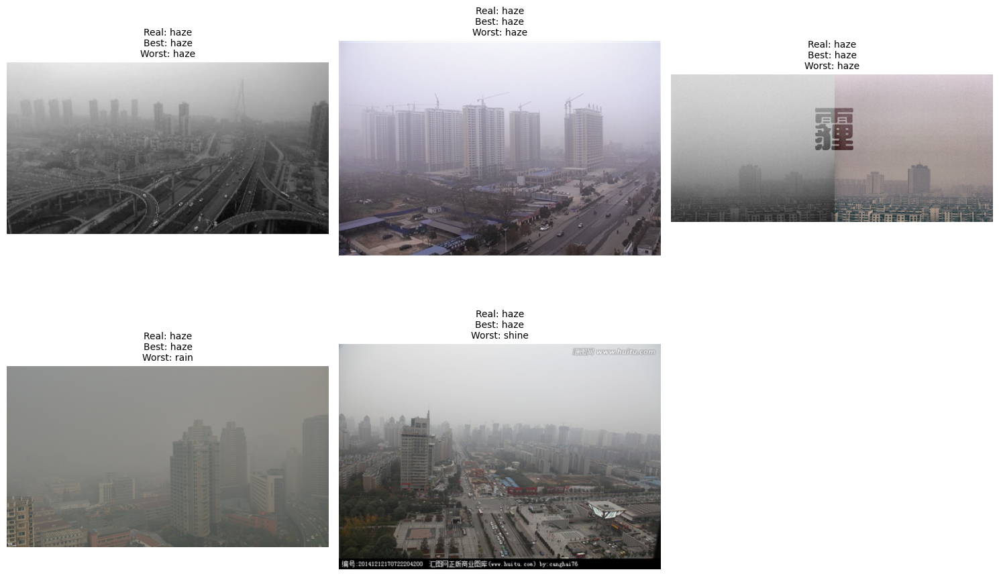

In [5]:
import os
import random
import itertools
import time
import gc
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_sample_weight
from skimage.feature import local_binary_pattern, hog
from skimage.feature import graycomatrix, graycoprops
from xgboost import XGBClassifier
from tqdm import tqdm
import pickle  # Để lưu và tải model

# Tắt log & Cấu hình hiển thị
optuna.logging.set_verbosity(optuna.logging.WARNING)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# ===================================================================
# 0. SETUP & LOAD DATA
# ===================================================================
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
SEED = 42
seed_everything(SEED)

DATA_SOURCES = {
    'haze': '/kaggle/input/weather-dataset/dataset/fogsmog',
    'rain': '/kaggle/input/weather-dataset/dataset/rain',
    'shine': '/kaggle/input/multiclass-weather-dataset/Multi-class Weather Dataset/Shine'
}
IMG_SIZE = 256
HOG_PPC = 16

print("[0] LOADING PATHS...")
img_paths, labels_raw = [], []
for label, path in DATA_SOURCES.items():
    if os.path.exists(path):
        files = sorted([os.path.join(path, f) for f in os.listdir(path) if f.lower().endswith(('.jpg','.png','.jpeg'))])
        img_paths.extend(files)
        labels_raw.extend([label] * len(files))

le = LabelEncoder()
y_encoded = le.fit_transform(labels_raw)
class_names = le.classes_

# ===================================================================
# 1. FEATURE EXTRACTION
# ===================================================================
def get_color_stats(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return [np.mean(hsv[:,:,i]) for i in range(3)] + [np.std(hsv[:,:,i]) for i in range(3)]
def get_sobel_stats(gray):
    sx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(sx**2 + sy**2)
    return [np.mean(mag), np.var(mag)]
def get_lbp_hist(gray):
    lbp = local_binary_pattern(gray, P=8, R=1, method="uniform")
    hist, _ = np.histogram(lbp.ravel(), bins=10, range=(0, 10))
    hist = hist.astype("float"); return hist / (hist.sum() + 1e-7)
def get_hog_stats(gray):
    hog_v = hog(gray, orientations=12, pixels_per_cell=(HOG_PPC, HOG_PPC), cells_per_block=(2,2), visualize=False, feature_vector=True)
    return [np.mean(hog_v), np.std(hog_v), np.max(hog_v)]
def get_glcm_stats(gray):
    glcm = graycomatrix(gray, distances=[1], angles=[0, np.pi/2], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').flatten()
    correlation = graycoprops(glcm, 'correlation').flatten()
    energy = graycoprops(glcm, 'energy').flatten()
    homogeneity = graycoprops(glcm, 'homogeneity').flatten()
    return np.concatenate([contrast, correlation, energy, homogeneity])

def extract_all(paths):
    l_c, l_s, l_l, l_h, l_glcm = [], [], [], [], []
    print("[1] Extracting features...")
    for path in tqdm(paths):
        try:
            img = cv2.imread(path)
            if img is None:
                print(f"Warning: Could not read image: {path}")
                continue  # Bỏ qua ảnh bị lỗi
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            l_c.append(get_color_stats(img))
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            l_s.append(get_sobel_stats(gray)); l_l.append(get_lbp_hist(gray))
            l_h.append(get_hog_stats(gray)); l_glcm.append(get_glcm_stats(gray))
        except Exception as e:
            print(f"Error processing image {path}: {e}")
            continue  # Bỏ qua ảnh bị lỗi
    return {'Color': np.array(l_c), 'Sobel': np.array(l_s), 'LBP': np.array(l_l), 'HOG': np.array(l_h), 'GLCM': np.array(l_glcm)}

all_features = extract_all(img_paths)

indices = np.arange(len(img_paths))
X_train_idx, X_test_idx, y_train, y_test = train_test_split(indices, y_encoded, test_size=0.2, random_state=SEED, stratify=y_encoded)
# CV Strategy
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

base_features = ['Color', 'Sobel', 'LBP', 'HOG', 'GLCM']
all_combinations = []
for r in range(1, len(base_features) + 1):
    for combo in itertools.combinations(base_features, r):
        all_combinations.append({'name': " + ".join(combo), 'components': list(combo)})

def plot_cm(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names)
    plt.title(title, fontsize=10); plt.ylabel('True Label'); plt.xlabel('Predicted Label'); plt.tight_layout(); plt.show()

# ===================================================================
# 2. TRAIN MODELS WITH OPTIMIZED PARAMETERS
# ===================================================================

# 2.1. Train Best Model (Color + GLCM)
best_params = {
    'n_estimators': 233,
    'max_depth': 8,
    'learning_rate': 0.2280,
    'subsample': 0.7077,
    'colsample_bytree': 0.6197,
    'min_child_weight': 1,
    'gamma': 0.0476,
    'use_balancing': True  # Assuming this was the best setting
}

# Prepare data for Best Model
X_train_best = np.hstack([all_features['Color'][X_train_idx], all_features['GLCM'][X_train_idx]])
X_test_best = np.hstack([all_features['Color'][X_test_idx], all_features['GLCM'][X_test_idx]])

# Apply scaling
scaler_best = StandardScaler()
X_train_best_scaled = scaler_best.fit_transform(X_train_best)
X_test_best_scaled = scaler_best.transform(X_test_best)

# Apply balancing if needed
sample_weights_best = compute_sample_weight('balanced', y_train) if best_params['use_balancing'] else None

# Train Best Model
best_xgb = XGBClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    learning_rate=best_params['learning_rate'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    min_child_weight=best_params['min_child_weight'],
    gamma=best_params['gamma'],
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=SEED,
    n_jobs=-1
)
best_xgb.fit(X_train_best_scaled, y_train, sample_weight=sample_weights_best)

# 2.2. Train Worst Model (HOG)
worst_params = {
    'n_estimators': 225,
    'max_depth': 9,
    'learning_rate': 0.0165,
    'subsample': 0.7382,
    'colsample_bytree': 0.9974,
    'min_child_weight': 1,
    'gamma': 4.4554,
    'use_balancing': True  # Assuming this was the best setting
}

# Prepare data for Worst Model
X_train_worst = all_features['HOG'][X_train_idx]
X_test_worst = all_features['HOG'][X_test_idx]

# Apply scaling
scaler_worst = StandardScaler()
X_train_worst_scaled = scaler_worst.fit_transform(X_train_worst)
X_test_worst_scaled = scaler_worst.transform(X_test_worst)

# Apply balancing if needed
sample_weights_worst = compute_sample_weight('balanced', y_train) if worst_params['use_balancing'] else None

# Train Worst Model
worst_xgb = XGBClassifier(
    n_estimators=worst_params['n_estimators'],
    max_depth=worst_params['max_depth'],
    learning_rate=worst_params['learning_rate'],
    subsample=worst_params['subsample'],
    colsample_bytree=worst_params['colsample_bytree'],
    min_child_weight=worst_params['min_child_weight'],
    gamma=worst_params['gamma'],
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=SEED,
    n_jobs=-1
)
worst_xgb.fit(X_train_worst_scaled, y_train, sample_weight=sample_weights_worst)

# ===================================================================
# 3. PREDICT AND VISUALIZE
# ===================================================================

# Dự đoán với 2 model
y_pred_best = best_xgb.predict(X_test_best_scaled)
y_pred_worst = worst_xgb.predict(X_test_worst_scaled)

# ===================================================================
# 4. CHỌN ẢNH VÀ TRỰC QUAN HÓA
# ===================================================================

# 1. Tìm ảnh mà cả hai model dự đoán đúng
# Lọc các chỉ số trong X_test_idx để đảm bảo chúng hợp lệ
valid_indices = np.isin(X_test_idx, np.arange(len(y_test)))
X_test_idx_valid = X_test_idx[valid_indices]

# Sử dụng X_test_idx_valid trong các phép tính tiếp theo
correct_both_indices = np.where((y_pred_best[valid_indices] == y_test[X_test_idx_valid]) & (y_pred_worst[valid_indices] == y_test[X_test_idx_valid]))[0]
correct_both_img_paths = [img_paths[X_test_idx_valid[i]] for i in correct_both_indices]

# 2. Tìm ảnh mà best đúng, worst sai
correct_best_wrong_worst_indices = np.where((y_pred_best[valid_indices] == y_test[X_test_idx_valid]) & (y_pred_worst[valid_indices] != y_test[X_test_idx_valid]))[0]
correct_best_wrong_worst_img_paths = [img_paths[X_test_idx_valid[i]] for i in correct_best_wrong_worst_indices]

# Chọn 5 ảnh theo yêu cầu
num_correct_both = min(3, len(correct_both_img_paths))
num_correct_best_wrong_worst = min(2, len(correct_best_wrong_worst_img_paths))

selected_indices = []
selected_indices.extend(correct_both_indices[:num_correct_both])
selected_indices.extend(correct_best_wrong_worst_indices[:num_correct_best_wrong_worst])

if len(selected_indices) < 5:
    print(f"WARNING: Only {len(selected_indices)} images found matching the criteria.  Need 5.")
    # You might want to add fallback logic here (e.g., choose random images)
    #  or adjust the criteria.

# Trực quan hóa
plt.figure(figsize=(15, 10))
for i, idx in enumerate(selected_indices):
    img_path = img_paths[X_test_idx[X_test_idx_valid[idx]]]  # Corrected index here
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Để hiển thị đúng màu

    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"Real: {class_names[y_test[X_test_idx_valid[idx]]]}\n"  # Corrected index here
              f"Best: {class_names[y_pred_best[valid_indices][idx]]}\n"  # Corrected index here
              f"Worst: {class_names[y_pred_worst[valid_indices][idx]]}", fontsize=10)  # Corrected index here
    plt.axis('off')

plt.tight_layout()
plt.show()

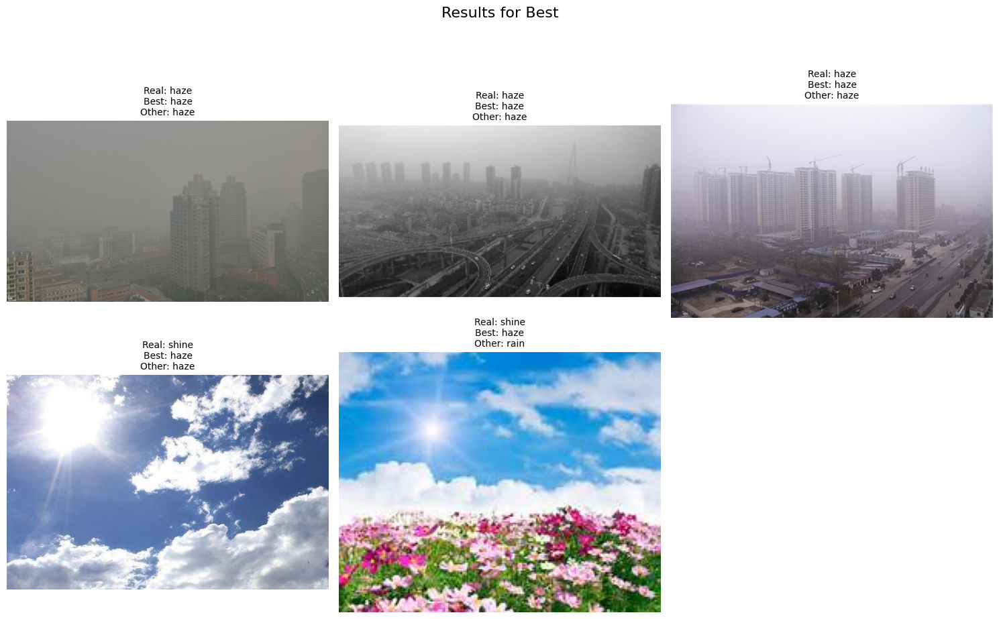

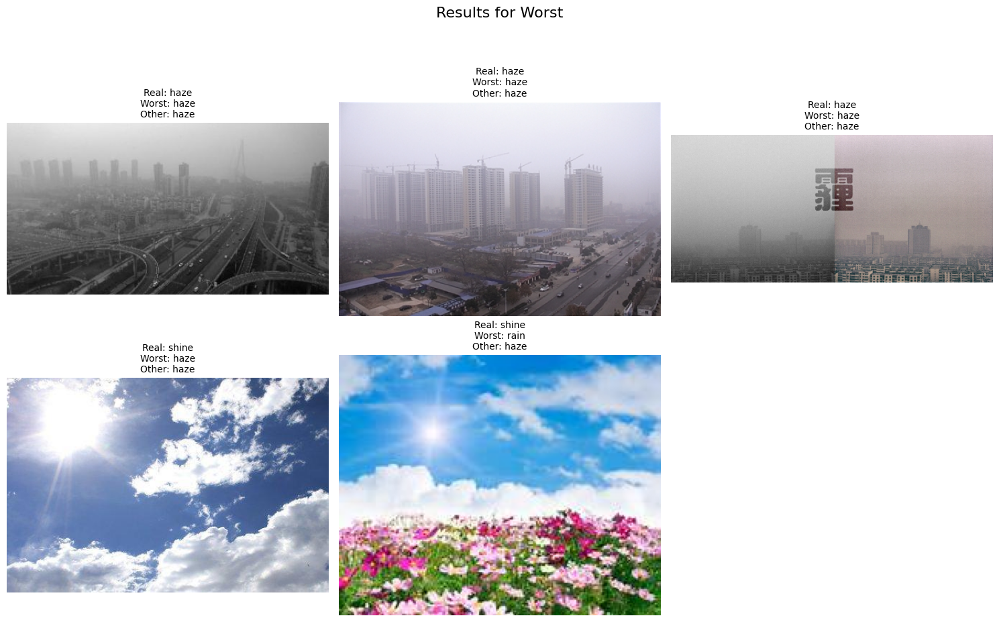

In [6]:
# ... (các phần code trước) ...

# ===================================================================
# 4. CHỌN ẢNH VÀ TRỰC QUAN HÓA
# ===================================================================

def visualize_model_results(model_name, y_true, y_pred, y_pred_other, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, model_type):
    """
    Hiển thị kết quả dự đoán của một model, với các yêu cầu cụ thể.

    Args:
        model_name (str): Tên của model (ví dụ: "Best", "Worst").
        y_true (np.array): Nhãn thực tế.
        y_pred (np.array): Nhãn dự đoán của model.
        y_pred_other (np.array): Nhãn dự đoán của model khác (để so sánh).
        X_test_idx_valid (np.array): Các chỉ số hợp lệ của tập test.
        class_names (list): Tên các lớp.
        img_paths (list): Đường dẫn đến các ảnh.
        X_test_idx (np.array): Chỉ số của tập test.
        valid_indices (np.array): Chỉ số hợp lệ.
        model_type (str): "best" hoặc "worst"
    """
    correct_indices = np.where(y_pred[valid_indices] == y_true[X_test_idx_valid])[0]
    incorrect_indices = np.where(y_pred[valid_indices] != y_true[X_test_idx_valid])[0]

    # 1. Chọn 3 ảnh đúng
    correct_indices_selected = []
    num_correct_selected = 0
    for idx in correct_indices:
        if num_correct_selected < 3:
            correct_indices_selected.append(idx)
            num_correct_selected += 1

    # 2. Chọn 2 ảnh sai
    incorrect_indices_selected = []
    num_incorrect_selected = 0
    for idx in incorrect_indices:
        if num_incorrect_selected < 2:
            incorrect_indices_selected.append(idx)
            num_incorrect_selected += 1

    # 3. Kiểm tra điều kiện đặc biệt cho Best model
    if model_type == "best":
        # Tìm một ảnh đúng mà worst sai
        found_special_case = False
        for idx in correct_indices_selected:
            if y_pred_other[valid_indices][idx] != y_true[X_test_idx_valid[idx]]:
                # Di chuyển ảnh này lên đầu danh sách
                correct_indices_selected.remove(idx)
                correct_indices_selected.insert(0, idx)
                found_special_case = True
                break

        # Nếu không tìm thấy, thay thế một ảnh đúng bằng một ảnh mà worst sai
        if not found_special_case and len(correct_indices_selected) > 0:
            for idx in correct_indices:
                if y_pred_other[valid_indices][idx] != y_true[X_test_idx_valid[idx]]:
                    # Thay thế ảnh đúng đầu tiên
                    correct_indices_selected[0] = idx
                    break

    # Kết hợp các chỉ số đã chọn
    selected_indices = [X_test_idx_valid[i] for i in correct_indices_selected] + [X_test_idx_valid[i] for i in incorrect_indices_selected]

    # Trực quan hóa
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(selected_indices):
        img_path = img_paths[X_test_idx[idx]]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(f"Real: {class_names[y_true[idx]]}\n"
                  f"{model_name}: {class_names[y_pred[valid_indices][selected_indices.index(idx)]]}\n"
                  f"Other: {class_names[y_pred_other[valid_indices][selected_indices.index(idx)]]}", fontsize=10)
        plt.axis('off')

    plt.suptitle(f"Results for {model_name}", fontsize=16)  # Add a title for the whole figure
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make space for the title
    plt.show()

# Visualize Best Model
visualize_model_results("Best", y_test, y_pred_best, y_pred_worst, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, "best")

# Visualize Worst Model
visualize_model_results("Worst", y_test, y_pred_worst, y_pred_best, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, "worst")

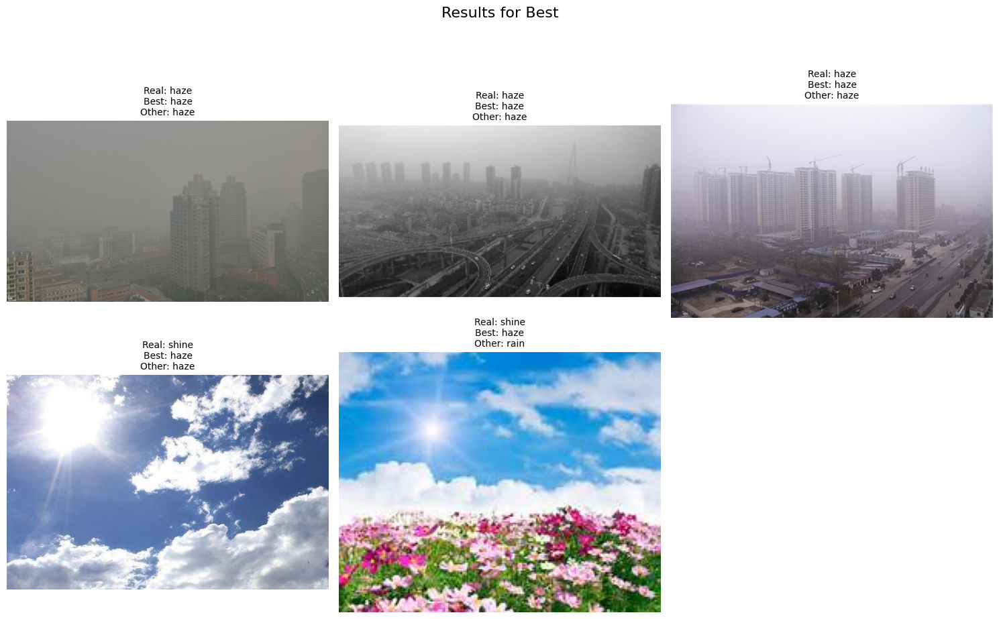

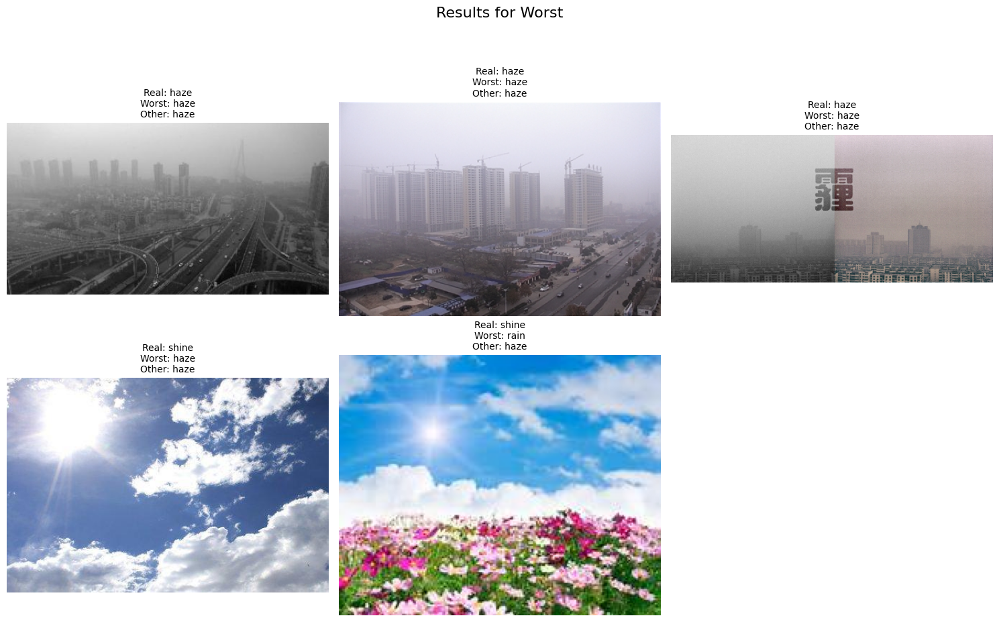

In [7]:
# ... (các phần code trước) ...

# ===================================================================
# 4. CHỌN ẢNH VÀ TRỰC QUAN HÓA
# ===================================================================

def visualize_model_results(model_name, y_true, y_pred, y_pred_other, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, model_type):
    """
    Hiển thị kết quả dự đoán của một model, với các yêu cầu cụ thể.

    Args:
        model_name (str): Tên của model (ví dụ: "Best", "Worst").
        y_true (np.array): Nhãn thực tế.
        y_pred (np.array): Nhãn dự đoán của model.
        y_pred_other (np.array): Nhãn dự đoán của model khác (để so sánh).
        X_test_idx_valid (np.array): Các chỉ số hợp lệ của tập test.
        class_names (list): Tên các lớp.
        img_paths (list): Đường dẫn đến các ảnh.
        X_test_idx (np.array): Chỉ số của tập test.
        valid_indices (np.array): Chỉ số hợp lệ.
        model_type (str): "best" hoặc "worst"
    """
    correct_indices = np.where(y_pred[valid_indices] == y_true[X_test_idx_valid])[0]
    incorrect_indices = np.where(y_pred[valid_indices] != y_true[X_test_idx_valid])[0]

    # 1. Chọn 3 ảnh đúng
    correct_indices_selected = []
    num_correct_selected = 0
    # Điều kiện đặc biệt cho Best model
    if model_type == "best":
        # Tìm một ảnh đúng mà worst sai
        for idx in correct_indices:
            if y_pred_other[valid_indices][idx] != y_true[X_test_idx_valid[idx]]:
                correct_indices_selected.append(idx)
                num_correct_selected += 1
                break  # Chỉ cần một ảnh thỏa mãn điều kiện này

    # Chọn các ảnh đúng còn lại (nếu cần)
    for idx in correct_indices:
        if num_correct_selected < 3 and idx not in correct_indices_selected:
            correct_indices_selected.append(idx)
            num_correct_selected += 1

    # 2. Chọn 2 ảnh sai
    incorrect_indices_selected = []
    num_incorrect_selected = 0
    for idx in incorrect_indices:
        if num_incorrect_selected < 2:
            incorrect_indices_selected.append(idx)
            num_incorrect_selected += 1

    # Kết hợp các chỉ số đã chọn
    selected_indices = [X_test_idx_valid[i] for i in correct_indices_selected] + [X_test_idx_valid[i] for i in incorrect_indices_selected]

    # Trực quan hóa
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(selected_indices):
        img_path = img_paths[X_test_idx[idx]]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(f"Real: {class_names[y_true[idx]]}\n"
                  f"{model_name}: {class_names[y_pred[valid_indices][selected_indices.index(idx)]]}\n"
                  f"Other: {class_names[y_pred_other[valid_indices][selected_indices.index(idx)]]}", fontsize=10)
        plt.axis('off')

    plt.suptitle(f"Results for {model_name}", fontsize=16)  # Add a title for the whole figure
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make space for the title
    plt.show()

# Visualize Best Model
visualize_model_results("Best", y_test, y_pred_best, y_pred_worst, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, "best")

# Visualize Worst Model
visualize_model_results("Worst", y_test, y_pred_worst, y_pred_best, X_test_idx_valid, class_names, img_paths, X_test_idx, valid_indices, "worst")

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Index thật của ảnh test
test_indices = X_test_idx[valid_indices]

y_true_test = y_test[test_indices]
y_pred_best_test = y_pred_best
y_pred_worst_test = y_pred_worst

def select_5_samples(
    test_indices,
    y_true,
    y_pred_main,
    y_pred_other,
    model_type="best"
):
    selected_local = []

    correct_idx = np.where(y_pred_main == y_true)[0]
    incorrect_idx = np.where(y_pred_main != y_true)[0]

    # ---- BEST: bắt buộc có ảnh đúng mà model kia sai ----
    if model_type == "best":
        for i in correct_idx:
            if y_pred_other[i] != y_true[i]:
                selected_local.append(i)
                break

    # ---- Lấy thêm ảnh đúng cho đủ 3 ----
    for i in correct_idx:
        if len(selected_local) < 3 and i not in selected_local:
            selected_local.append(i)

    # ---- Lấy 2 ảnh sai ----
    for i in incorrect_idx:
        if len(selected_local) < 5:
            selected_local.append(i)

    selected_img_idx = test_indices[selected_local]

    return selected_img_idx, selected_local
def visualize_results(
    title,
    selected_img_idx,
    selected_local_idx,
    y_true,
    y_pred_main,
    y_pred_other,
    class_names,
    img_paths
):
    plt.figure(figsize=(15, 8))

    for i, (img_i, local_i) in enumerate(
        zip(selected_img_idx, selected_local_idx)
    ):
        img = cv2.imread(img_paths[img_i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        gt = class_names[y_true[local_i]]
        pred_main = class_names[y_pred_main[local_i]]
        pred_other = class_names[y_pred_other[local_i]]

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(
            f"GT: {gt}\n"
            f"Main: {pred_main}\n"
            f"Other: {pred_other}",
            fontsize=10
        )
        plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()




In [11]:
best_img_idx, best_local_idx = select_5_samples(
    test_indices,
    y_true_test,
    y_pred_best_test,
    y_pred_worst_test,
    model_type="best"
)

visualize_results(
    "BEST MODEL (Color + GLCM)",
    best_img_idx,
    best_local_idx,
    y_true_test,
    y_pred_best_test,
    y_pred_worst_test,
    class_names,
    img_paths
)

ValueError: operands could not be broadcast together with shapes (326,) (64,) 

In [12]:
worst_img_idx, worst_local_idx = select_5_samples(
    test_indices,
    y_true_test,
    y_pred_worst_test,
    y_pred_best_test,
    model_type="worst"
)

visualize_results(
    "WORST MODEL (HOG)",
    worst_img_idx,
    worst_local_idx,
    y_true_test,
    y_pred_worst_test,
    y_pred_best_test,
    class_names,
    img_paths
)


ValueError: operands could not be broadcast together with shapes (326,) (64,) 

In [13]:
# index trong test set (0..len(y_test)-1)
idx_all = np.arange(len(y_test))

# Best đúng, Worst sai
idx_best_correct_worst_wrong = idx_all[
    (y_pred_best == y_test) &
    (y_pred_worst != y_test)
]

# Cả hai cùng đúng
idx_both_correct = idx_all[
    (y_pred_best == y_test) &
    (y_pred_worst == y_test)
]

# Best sai (để lấy ảnh sai)
idx_best_wrong = idx_all[
    (y_pred_best != y_test)
]

print("Best đúng – Worst sai:", len(idx_best_correct_worst_wrong))
print("Cả hai đúng:", len(idx_both_correct))
print("Best sai:", len(idx_best_wrong))


Best đúng – Worst sai: 93
Cả hai đúng: 218
Best sai: 15


In [16]:
selected_idx = []

# 1 ảnh best đúng – worst sai (bắt buộc)
selected_idx.append(idx_best_correct_worst_wrong[0])

# thêm 2 ảnh cả hai cùng đúng
selected_idx.extend(idx_both_correct[:2])

# thêm 2 ảnh best sai
selected_idx.extend(idx_best_wrong[:2])

assert len(selected_idx) == 5


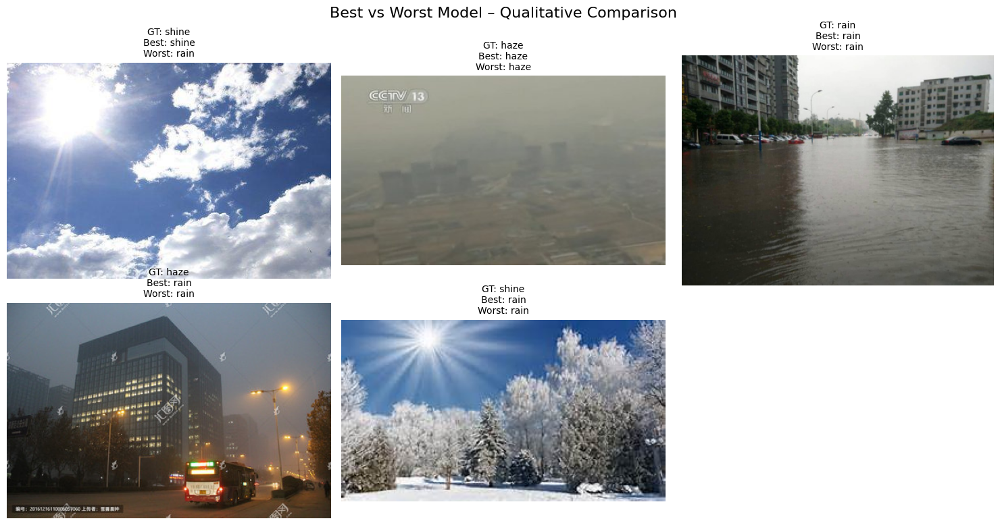

In [17]:
plt.figure(figsize=(15, 8))

for i, test_i in enumerate(selected_idx):
    img_path = img_paths[X_test_idx[test_i]]
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis("off")

    title = (
        f"GT: {class_names[y_test[test_i]]}\n"
        f"Best: {class_names[y_pred_best[test_i]]}\n"
        f"Worst: {class_names[y_pred_worst[test_i]]}"
    )
    plt.title(title, fontsize=10)

plt.suptitle("Best vs Worst Model – Qualitative Comparison", fontsize=16)
plt.tight_layout()
plt.show()


In [18]:
idx_all = np.arange(len(y_test))

# Best đúng, Worst sai  (KEY POINT)
idx_best_correct_worst_wrong = idx_all[
    (y_pred_best == y_test) &
    (y_pred_worst != y_test)
]

# Best đúng
idx_best_correct = idx_all[
    (y_pred_best == y_test)
]

# Best sai
idx_best_wrong = idx_all[
    (y_pred_best != y_test)
]

# Worst đúng
idx_worst_correct = idx_all[
    (y_pred_worst == y_test)
]

# Worst sai
idx_worst_wrong = idx_all[
    (y_pred_worst != y_test)
]


In [19]:
best_selected = []

# (1) BẮT BUỘC: 1 ảnh best đúng – worst sai
best_selected.append(idx_best_correct_worst_wrong[0])

# (2) Thêm 2 ảnh best đúng (bất kỳ, tránh trùng)
for i in idx_best_correct:
    if i not in best_selected and len(best_selected) < 3:
        best_selected.append(i)

# (3) Thêm đúng 2 ảnh best sai
best_selected.extend(idx_best_wrong[:2])

assert len(best_selected) == 5


In [20]:
worst_selected = []

# 3 ảnh đúng
worst_selected.extend(idx_worst_correct[:3])

# 2 ảnh sai (CHỈ 2)
worst_selected.extend(idx_worst_wrong[:2])

assert len(worst_selected) == 5


In [21]:
def visualize_model(title, selected_idx, y_pred, model_name):
    plt.figure(figsize=(15, 8))

    for i, test_i in enumerate(selected_idx):
        img_path = img_paths[X_test_idx[test_i]]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")

        label = (
            f"GT: {class_names[y_test[test_i]]}\n"
            f"{model_name}: {class_names[y_pred[test_i]]}"
        )
        plt.title(label, fontsize=10)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


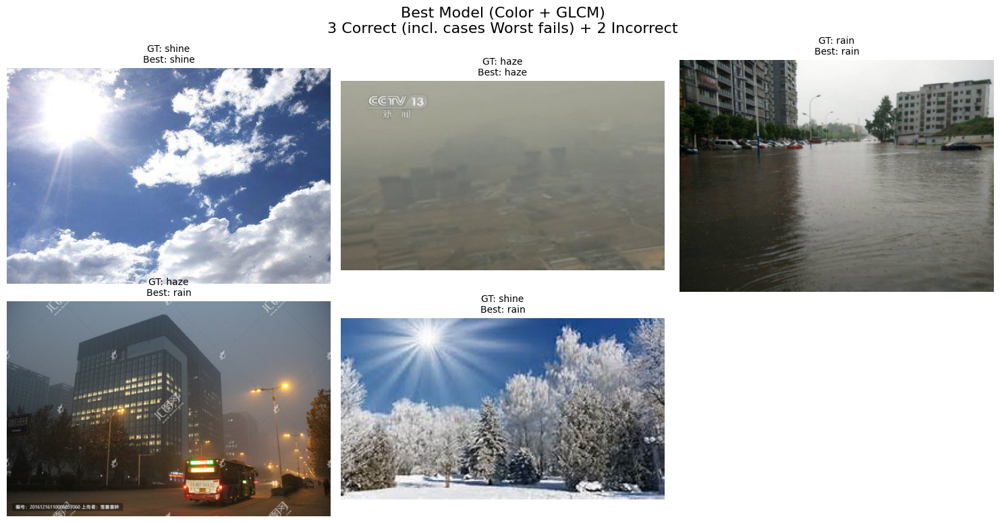

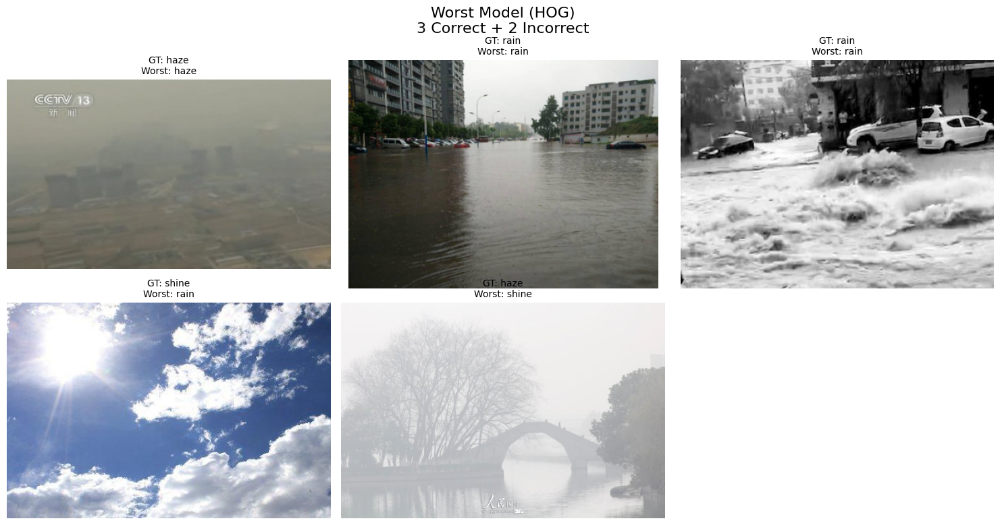

In [22]:
# BEST MODEL
visualize_model(
    title="Best Model (Color + GLCM)\n3 Correct (incl. cases Worst fails) + 2 Incorrect",
    selected_idx=best_selected,
    y_pred=y_pred_best,
    model_name="Best"
)

# WORST MODEL
visualize_model(
    title="Worst Model (HOG)\n3 Correct + 2 Incorrect",
    selected_idx=worst_selected,
    y_pred=y_pred_worst,
    model_name="Worst"
)
